#MOUNTING GOOGLE DRIVE

The datasets_path includes path to all datasets that will be used in our project


In [ ]:
# Import PyDrive and associated libraries.
# This only needs to be done once per notebook.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# DICOM Infos



*   the dataset is resized, cropped, and the format of the photos is JPEG
*   Medical screening usually use DICOM format which include Meta data about the image and the patient
*   the data set has already seperated the metadata into dicom_Info.csv



In [ ]:
import pandas as pd
DDSM_dir = "/content/drive/MyDrive/Project_shared/Datasets/mammography/CBIS-DDSM"
dicom_info = pd.read_csv(f'{DDSM_dir}/csv/dicom_info.csv')
dicom_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10237 entries, 0 to 10236
Data columns (total 38 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   file_path                                    10237 non-null  object 
 1   image_path                                   10237 non-null  object 
 2   AccessionNumber                              0 non-null      float64
 3   BitsAllocated                                10237 non-null  int64  
 4   BitsStored                                   10237 non-null  int64  
 5   BodyPartExamined                             10237 non-null  object 
 6   Columns                                      10237 non-null  int64  
 7   ContentDate                                  10237 non-null  int64  
 8   ContentTime                                  10237 non-null  float64
 9   ConversionType                               10237 non-null  object 
 10

In [ ]:
dicom_info['PatientID'].head()

0    Mass-Training_P_01265_RIGHT_MLO_1
1       Mass-Training_P_01754_RIGHT_CC
2       Calc-Training_P_00232_RIGHT_CC
3          Calc-Test_P_00562_LEFT_CC_2
4                P_00562_LEFT_CC_2.dcm
Name: PatientID, dtype: object

In [ ]:
dicom_info['image_path'].head()

0    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.129308...
1    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.248386...
2    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.267213...
3    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...
4    CBIS-DDSM/jpeg/1.3.6.1.4.1.9590.100.1.2.381187...
Name: image_path, dtype: object

The image_path atribute need to be changed to the actual directory path in colab

In [ ]:
dicom_info['image_path'] = dicom_info.image_path.apply(lambda x: x.replace('CBIS-DDSM', DDSM_dir))
dicom_info['image_path'].head()

0    /content/drive/MyDrive/Project_shared/Datasets...
1    /content/drive/MyDrive/Project_shared/Datasets...
2    /content/drive/MyDrive/Project_shared/Datasets...
3    /content/drive/MyDrive/Project_shared/Datasets...
4    /content/drive/MyDrive/Project_shared/Datasets...
Name: image_path, dtype: object

checking if there is a null value specifically for image_path

In [ ]:
dicom_info['image_path'].isnull().sum()

0

# Converted image types

In [ ]:
#function definition 
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import numpy as np
import random
from tqdm import tqdm
import cv2

def show_grid(files, row=3, col=3):
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.resize(cv2.imread(image_path), dsize=(512,512))
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

In [ ]:
dicom_info.SeriesDescription.value_counts(dropna=False)

cropped images           3567
ROI mask images          3247
full mammogram images    2857
NaN                       566
Name: SeriesDescription, dtype: int64

we have different type of images

* cropepd
* ROI images
* full 

However, some images are are not classified in the dicom data but that does not mean an absence of image. we might need to handle these missing values later if needed

100%|██████████| 4/4 [00:39<00:00,  9.79s/it]


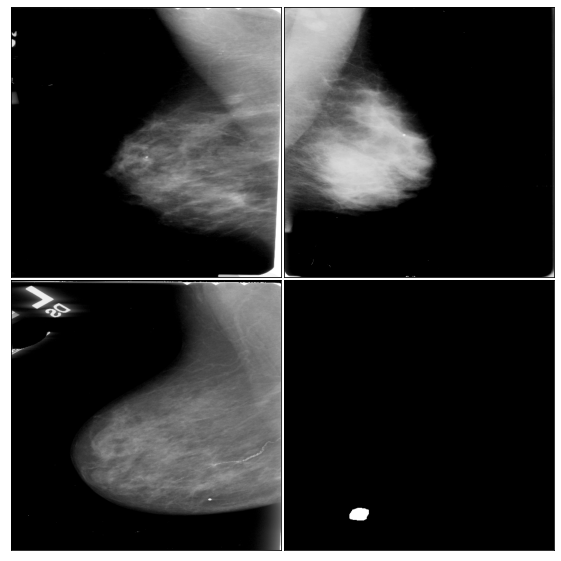

In [ ]:
dicom_info.SeriesDescription.value_counts(dropna=False)
show_grid(dicom_info[dicom_info.SeriesDescription.isnull()].image_path.tolist(),2,2)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


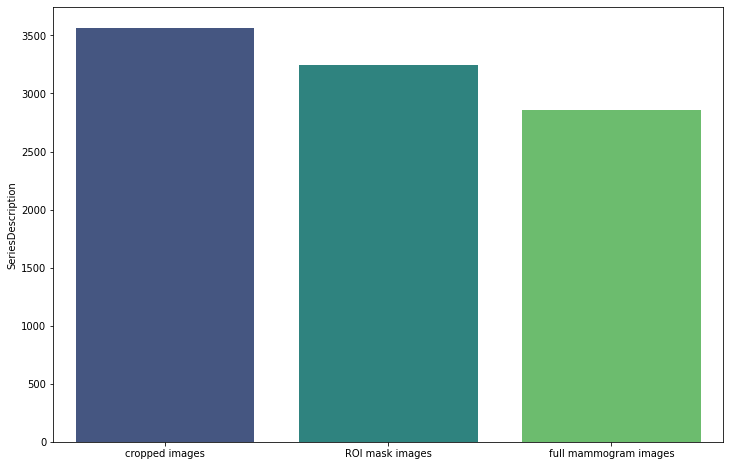

In [ ]:
import seaborn as sns

plt.figure(figsize=(12,8))
sns.barplot(dicom_info.SeriesDescription.value_counts(dropna=False).index, dicom_info.SeriesDescription.value_counts(dropna=False), palette='viridis')

lets plot some of the images to see how the look like from a random sample

**FULL MAMMOGRAM**

100%|██████████| 9/9 [00:06<00:00,  1.48it/s]


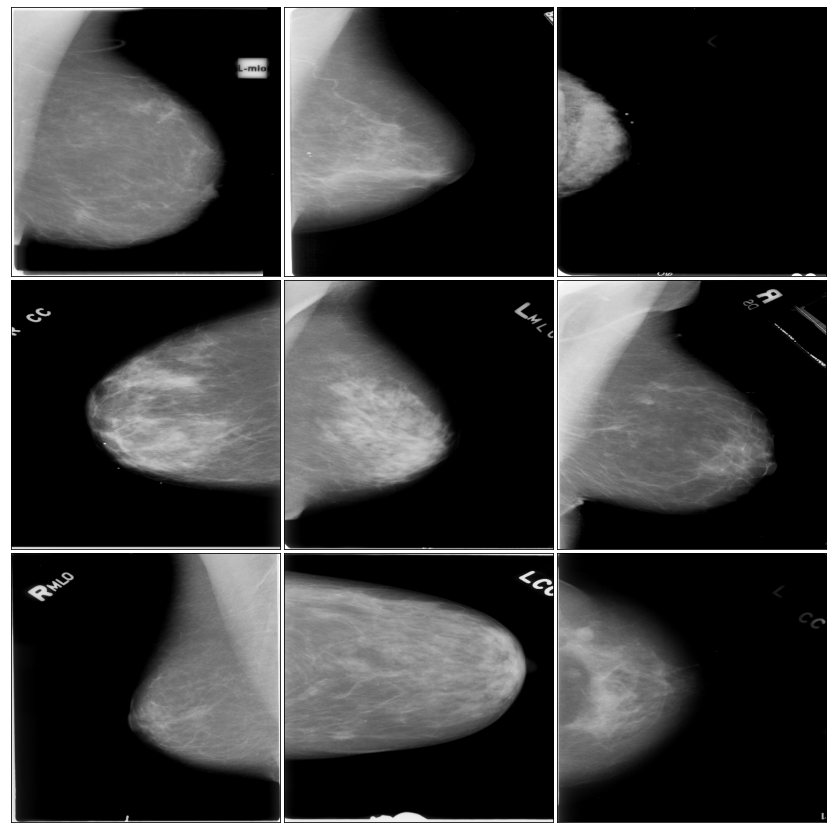

In [ ]:
show_grid(dicom_info[dicom_info.SeriesDescription=='full mammogram images'].image_path.tolist())

**CROPPED IMAGES**

100%|██████████| 9/9 [00:03<00:00,  2.57it/s]


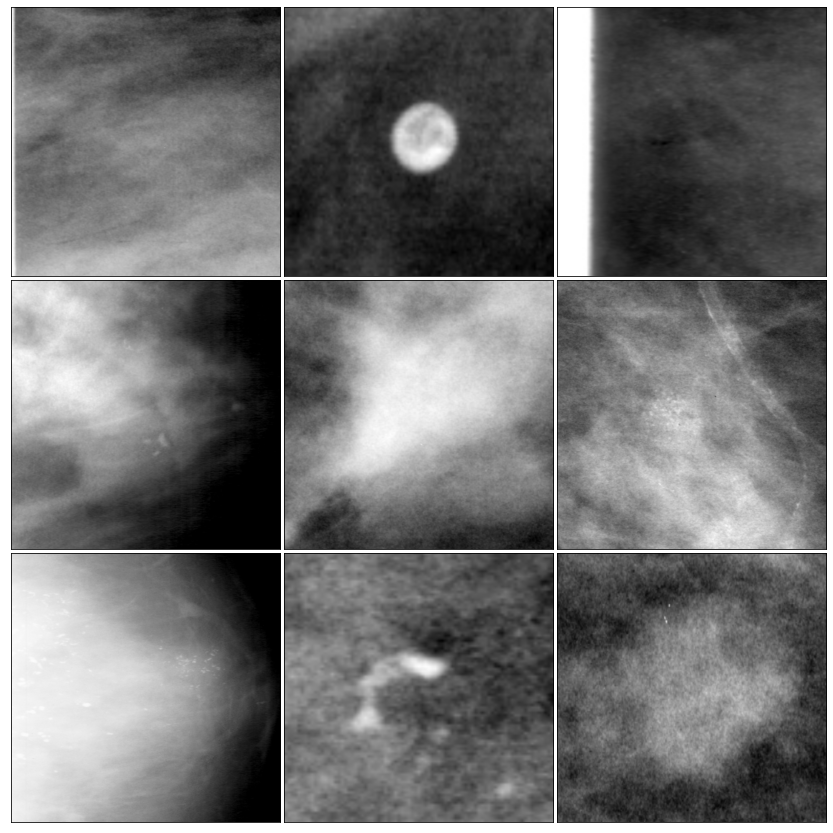

In [ ]:
show_grid(dicom_info[dicom_info.SeriesDescription=='cropped images'].image_path.tolist())

**ROI IMAGES**

ROI is a mask for the area of interest on screening 

100%|██████████| 9/9 [00:04<00:00,  1.83it/s]


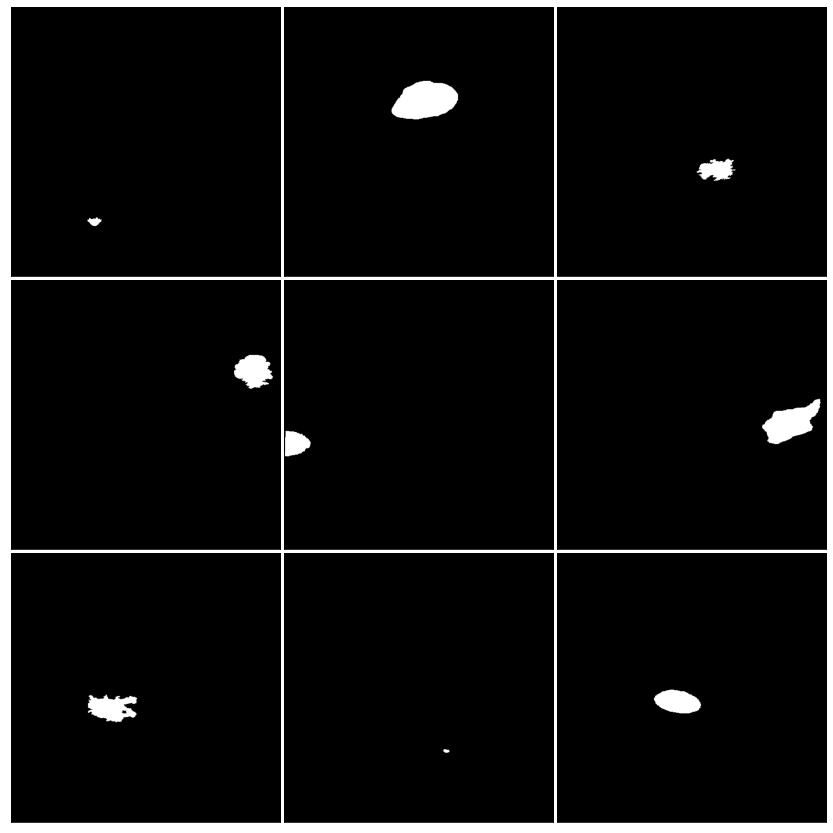

In [ ]:
show_grid(dicom_info[dicom_info.SeriesDescription=='ROI mask images'].image_path.tolist())

All the images that has a null value of the type are either full mammogram , or ROI. 
we might need to deal with thease null values later if needed.

100%|██████████| 529/529 [04:58<00:00,  1.77it/s]


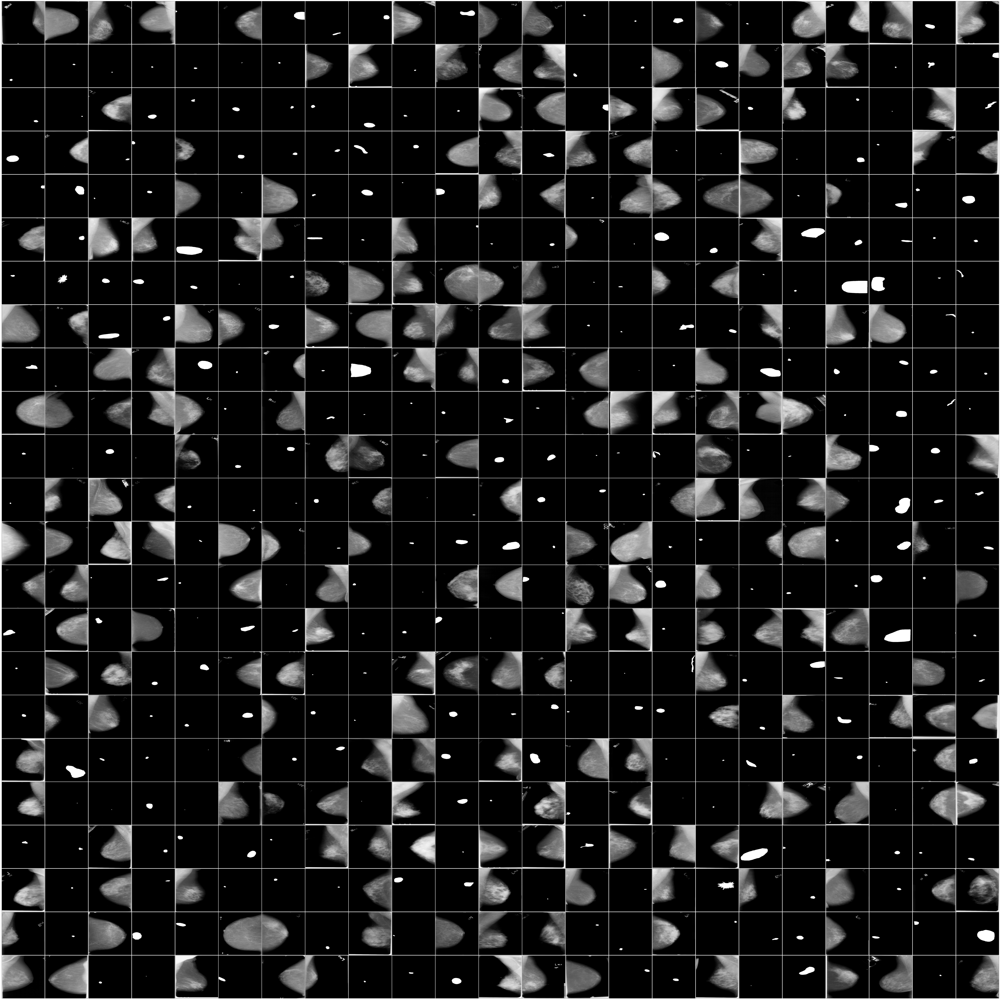

In [ ]:
show_grid(dicom_info[dicom_info.SeriesDescription.isnull()].image_path.tolist(),23,23)

# meta.csv

In [ ]:
meta_df = pd.read_csv(f'{DDSM_dir}/csv/meta.csv')
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6775 entries, 0 to 6774
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SeriesInstanceUID  6775 non-null   object
 1   StudyInstanceUID   6775 non-null   object
 2   Modality           6775 non-null   object
 3   SeriesDescription  6775 non-null   object
 4   BodyPartExamined   6775 non-null   object
 5   SeriesNumber       6775 non-null   int64 
 6   Collection         6775 non-null   object
 7   Visibility         6775 non-null   int64 
 8   ImageCount         6775 non-null   int64 
dtypes: int64(3), object(6)
memory usage: 476.5+ KB


In [ ]:
meta_df['SeriesDescription'].value_counts()

ROI mask images          3565
full mammogram images    3103
cropped images            107
Name: SeriesDescription, dtype: int64

# calc case description

In [ ]:
calc_df = pd.read_csv(f'{DDSM_dir}/csv/calc_case_description_train_set.csv')
calc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1546 entries, 0 to 1545
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   patient_id               1546 non-null   object
 1   breast density           1546 non-null   int64 
 2   left or right breast     1546 non-null   object
 3   image view               1546 non-null   object
 4   abnormality id           1546 non-null   int64 
 5   abnormality type         1546 non-null   object
 6   calc type                1526 non-null   object
 7   calc distribution        1170 non-null   object
 8   assessment               1546 non-null   int64 
 9   pathology                1546 non-null   object
 10  subtlety                 1546 non-null   int64 
 11  image file path          1546 non-null   object
 12  cropped image file path  1546 non-null   object
 13  ROI mask file path       1546 non-null   object
dtypes: int64(4), object(10)
memory usage: 16

In [ ]:
calc_df.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00005,3,RIGHT,CC,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_CC/1.3.6.1.4.1.959...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...,Calc-Training_P_00005_RIGHT_CC_1/1.3.6.1.4.1.9...
1,P_00005,3,RIGHT,MLO,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,Calc-Training_P_00005_RIGHT_MLO/1.3.6.1.4.1.95...,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....,Calc-Training_P_00005_RIGHT_MLO_1/1.3.6.1.4.1....
2,P_00007,4,LEFT,CC,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00007_LEFT_CC_1/1.3.6.1.4.1.95...
3,P_00007,4,LEFT,MLO,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,Calc-Training_P_00007_LEFT_MLO/1.3.6.1.4.1.959...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...,Calc-Training_P_00007_LEFT_MLO_1/1.3.6.1.4.1.9...
4,P_00008,1,LEFT,CC,1,calcification,NaN,REGIONAL,2,BENIGN_WITHOUT_CALLBACK,3,Calc-Training_P_00008_LEFT_CC/1.3.6.1.4.1.9590...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...,Calc-Training_P_00008_LEFT_CC_1/1.3.6.1.4.1.95...


In [ ]:
calc_df['calc type'].value_counts(dropna = False)

PLEOMORPHIC                                                 664
AMORPHOUS                                                   138
PUNCTATE                                                    106
LUCENT_CENTER                                                93
VASCULAR                                                     82
FINE_LINEAR_BRANCHING                                        77
COARSE                                                       35
ROUND_AND_REGULAR-LUCENT_CENTER                              31
PLEOMORPHIC-FINE_LINEAR_BRANCHING                            28
ROUND_AND_REGULAR-LUCENT_CENTER-PUNCTATE                     24
ROUND_AND_REGULAR-EGGSHELL                                   23
PUNCTATE-PLEOMORPHIC                                         21
NaN                                                          20
DYSTROPHIC                                                   20
LUCENT_CENTERED                                              18
ROUND_AND_REGULAR                       

In [ ]:
calc_df['pathology'].value_counts(dropna = False)

MALIGNANT                  544
BENIGN                     528
BENIGN_WITHOUT_CALLBACK    474
Name: pathology, dtype: int64

**Understanding useful relationships**

since most of the data is not numeric we will use chi - squared instead of correlations coefficients

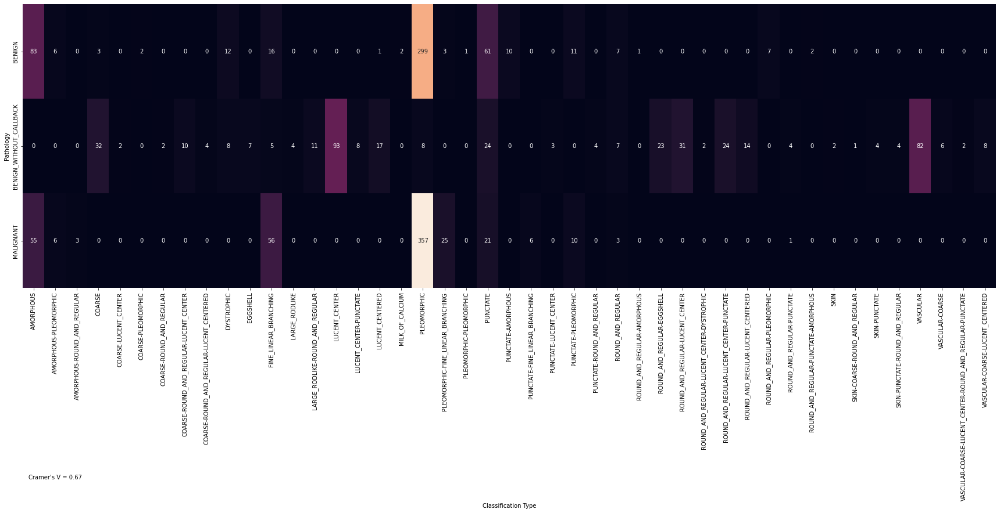

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

calc_df_sub = calc_df.dropna(subset=['calc type', 'pathology'])

contingency_table = pd.crosstab(calc_df_sub['pathology'], calc_df_sub['calc type'], dropna=True)

# Perform the chi-squared test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Compute Cramer's V
n = np.sum(contingency_table.values)
phi2 = chi2/n
r, k = contingency_table.shape
phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
r_corr = r - ((r-1)**2)/(n-1)
k_corr = k - ((k-1)**2)/(n-1)
V = np.sqrt(phi2corr / min((k_corr-1), (r_corr-1)))

# Plot the contingency table using seaborn's heatmap function
fig, ax = plt.subplots(figsize=(30, 9))
sns.heatmap(contingency_table, annot=True, fmt='d', cbar=False, ax=ax)
ax.set_xlabel('Classification Type')
ax.set_ylabel('Pathology')
plt.text(1.5,5 , "Cramer's V = {:.2f}".format(V), horizontalalignment='center', verticalalignment='center')
plt.show()



# Mass case description 

Mass case description have descriptive data of the mass found in the patient screening images.
our goal is to identify this mass and extract it's features to classify it into malegnant, abnormal or normal

In [ ]:
mass_df = pd.read_csv(f'{DDSM_dir}/csv/mass_case_description_train_set.csv')
mass_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1318 entries, 0 to 1317
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   patient_id               1318 non-null   object
 1   breast_density           1318 non-null   int64 
 2   left or right breast     1318 non-null   object
 3   image view               1318 non-null   object
 4   abnormality id           1318 non-null   int64 
 5   abnormality type         1318 non-null   object
 6   mass shape               1314 non-null   object
 7   mass margins             1275 non-null   object
 8   assessment               1318 non-null   int64 
 9   pathology                1318 non-null   object
 10  subtlety                 1318 non-null   int64 
 11  image file path          1318 non-null   object
 12  cropped image file path  1318 non-null   object
 13  ROI mask file path       1318 non-null   object
dtypes: int64(4), object(10)
memory usage: 14

In [ ]:
mass_df.head()

,patient_id,breast_density,left or right breast,image view,abnormality id,abnormality type,mass shape,mass margins,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00001,3,LEFT,CC,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00001_LEFT_CC_1/1.3.6.1.4.1.95...
1,P_00001,3,LEFT,MLO,1,mass,IRREGULAR-ARCHITECTURAL_DISTORTION,SPICULATED,4,MALIGNANT,4,Mass-Training_P_00001_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00001_LEFT_MLO_1/1.3.6.1.4.1.9...
2,P_00004,3,LEFT,CC,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_CC/1.3.6.1.4.1.9590...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...,Mass-Training_P_00004_LEFT_CC_1/1.3.6.1.4.1.95...
3,P_00004,3,LEFT,MLO,1,mass,ARCHITECTURAL_DISTORTION,ILL_DEFINED,4,BENIGN,3,Mass-Training_P_00004_LEFT_MLO/1.3.6.1.4.1.959...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...,Mass-Training_P_00004_LEFT_MLO_1/1.3.6.1.4.1.9...
4,P_00004,3,RIGHT,MLO,1,mass,OVAL,CIRCUMSCRIBED,4,BENIGN,5,Mass-Training_P_00004_RIGHT_MLO/1.3.6.1.4.1.95...,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....,Mass-Training_P_00004_RIGHT_MLO_1/1.3.6.1.4.1....


In [ ]:
mass_df['mass shape'].value_counts()

IRREGULAR                                   351
OVAL                                        321
LOBULATED                                   305
ROUND                                       123
ARCHITECTURAL_DISTORTION                     80
IRREGULAR-ARCHITECTURAL_DISTORTION           45
LYMPH_NODE                                   26
ASYMMETRIC_BREAST_TISSUE                     20
FOCAL_ASYMMETRIC_DENSITY                     19
OVAL-LYMPH_NODE                               6
LOBULATED-IRREGULAR                           5
ROUND-OVAL                                    3
LOBULATED-LYMPH_NODE                          3
IRREGULAR-FOCAL_ASYMMETRIC_DENSITY            2
LOBULATED-ARCHITECTURAL_DISTORTION            2
LOBULATED-OVAL                                1
ROUND-IRREGULAR-ARCHITECTURAL_DISTORTION      1
ROUND-LOBULATED                               1
Name: mass shape, dtype: int64

In [ ]:
mass_df['pathology'].value_counts(dropna = False)

MALIGNANT                  637
BENIGN                     577
BENIGN_WITHOUT_CALLBACK    104
Name: pathology, dtype: int64

In [ ]:
mass_df['subtlety'].value_counts(dropna = False)

5    543
4    375
3    257
2    100
1     41
0      2
Name: subtlety, dtype: int64

**Understanding the relationships**

like previously some of the data set are not numerical so we will use the same method as before

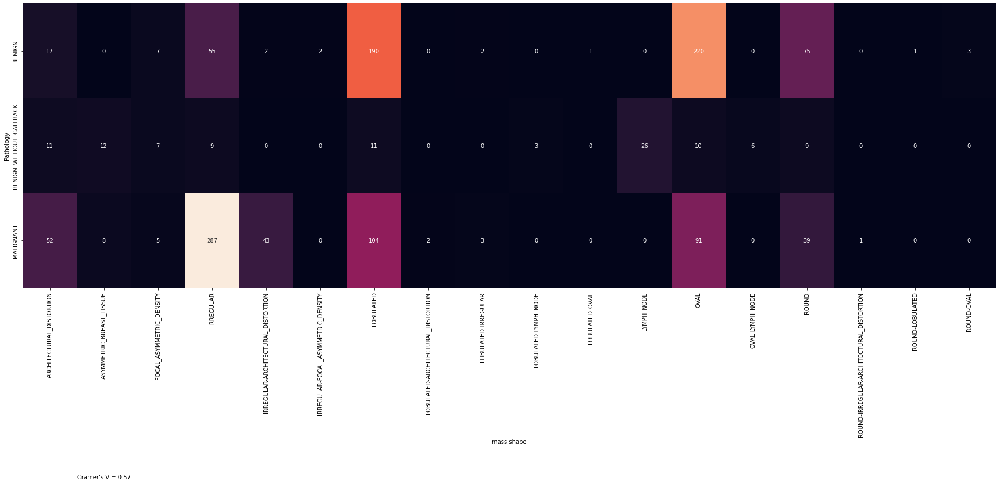

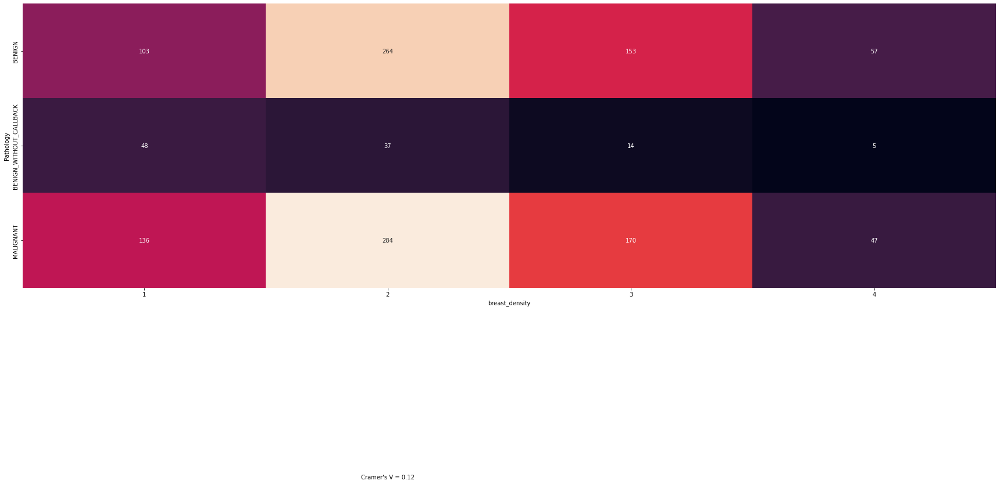

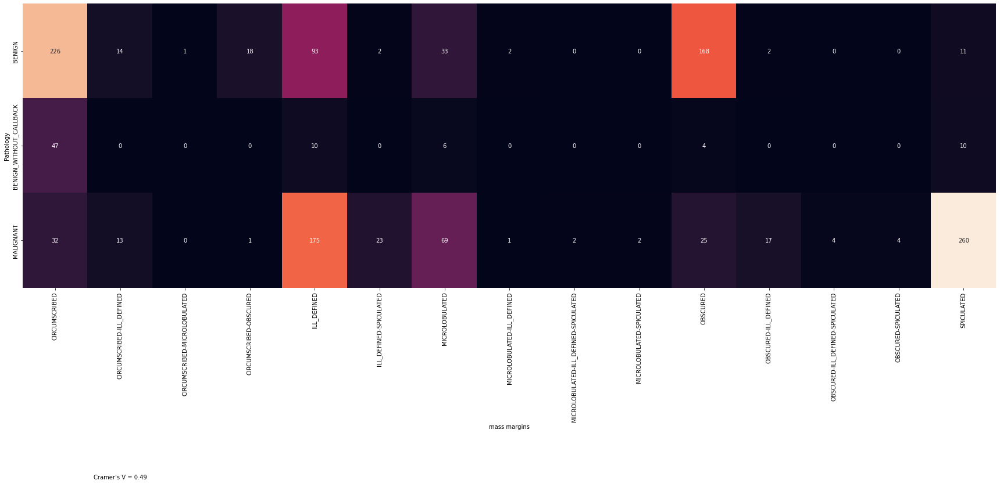

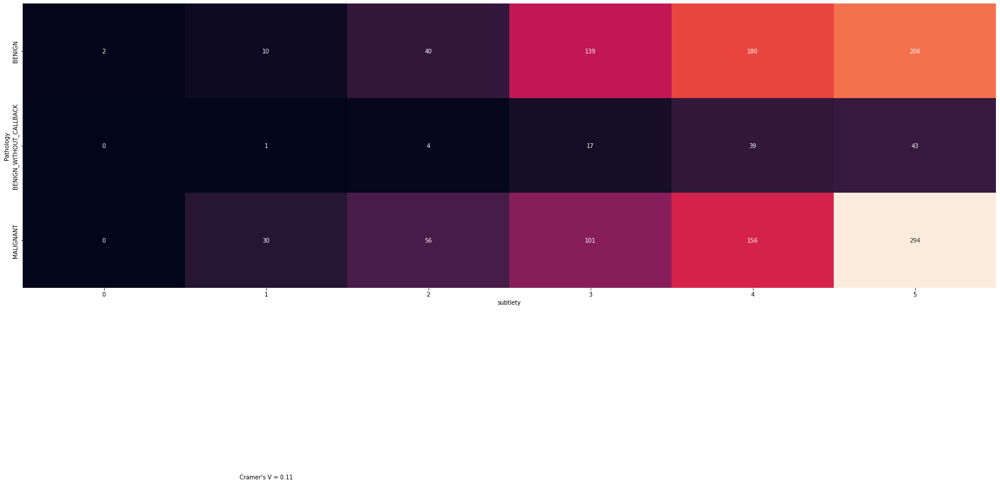

In [ ]:
# columns that we are intrested in: 
columns = ['mass shape','breast_density','mass margins','subtlety']


for column in columns:
  mass_df_sub = mass_df.dropna(subset=[column, 'pathology'])
  contingency_table_2 = pd.crosstab(mass_df_sub['pathology'], mass_df_sub[column], dropna=True)

  # Perform the chi-squared test
  chi2, p, dof, expected = chi2_contingency(contingency_table_2)

  # Compute Cramer's V
  n = np.sum(contingency_table_2.values)
  phi2 = chi2/n
  r, k = contingency_table_2.shape
  phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
  r_corr = r - ((r-1)**2)/(n-1)
  k_corr = k - ((k-1)**2)/(n-1)
  V = np.sqrt(phi2corr / min((k_corr-1), (r_corr-1)))

# Plot the contingency table using seaborn's heatmap function
  fig, ax = plt.subplots(figsize=(30, 9))
  sns.heatmap(contingency_table_2, annot=True, fmt='d', cbar=False, ax=ax)
  ax.set_xlabel(column)
  ax.set_ylabel('Pathology')
  plt.text(1.5,5 , "Cramer's V = {:.2f}".format(V), horizontalalignment='center', verticalalignment='center')
  plt.show()